In [1]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt
from IPython.display import display

%matplotlib inline

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [2]:
prompts = [
    "sksToy",
    "sksToy standing on a dresser against brown wall, view from above, object slightly left of center",
    "sksToy on a brown dresser leaning against brown wall, side view, looking right, object slightly left of center",
    "sksToy on a brown dresser against brown wall, looking straight, centered",
    "sksToy on right side on brown dresser leaning against brown wall",
    "sksToy standing on brown dresser, looking slightly right, side view",
    "sksToy on a table centered, looking diagonally, tousled hair"
]


In [3]:
print("Загружаем модель...")
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32)
pipe = pipe.to("cuda" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    pipe.enable_attention_slicing()

Загружаем модель...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!



[1/7] Генерация: sksToy...


  0%|          | 0/25 [00:00<?, ?it/s]

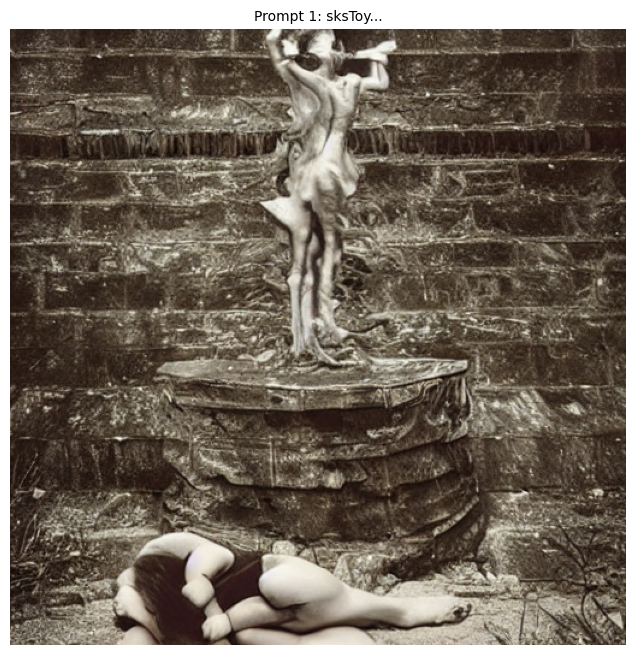

Размер изображения: (512, 512)

[2/7] Генерация: sksToy standing on a dresser against brown wall, view from a...


  0%|          | 0/25 [00:00<?, ?it/s]

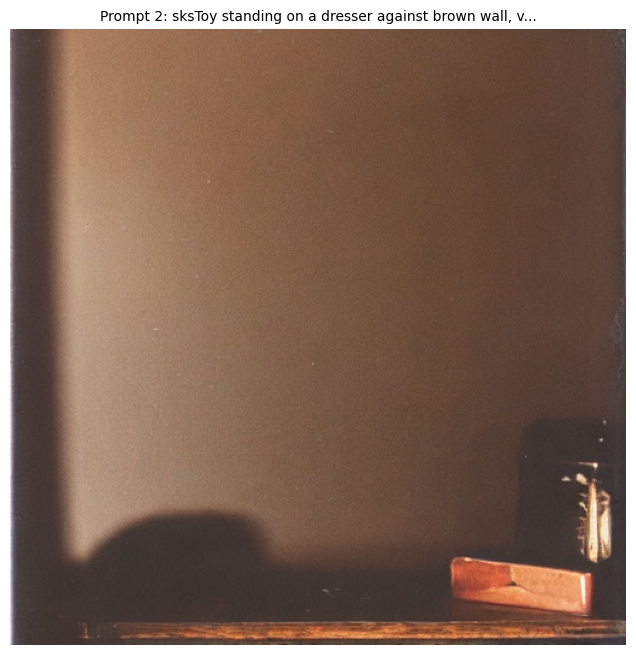

Размер изображения: (512, 512)

[3/7] Генерация: sksToy on a brown dresser leaning against brown wall, side v...


  0%|          | 0/25 [00:00<?, ?it/s]

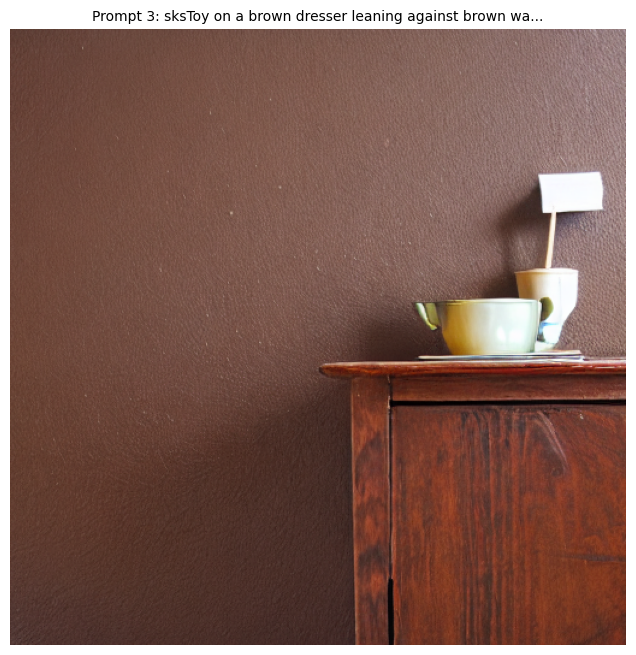

Размер изображения: (512, 512)

[4/7] Генерация: sksToy on a brown dresser against brown wall, looking straig...


  0%|          | 0/25 [00:00<?, ?it/s]

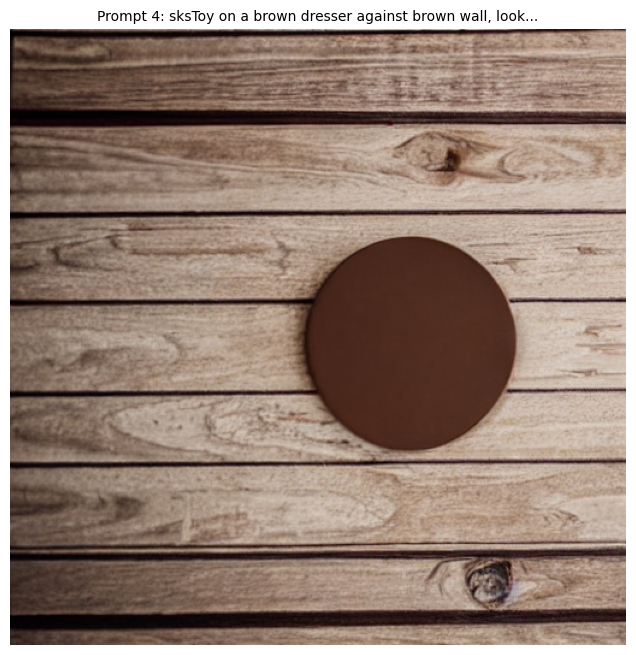

Размер изображения: (512, 512)

[5/7] Генерация: sksToy on right side on brown dresser leaning against brown ...


  0%|          | 0/25 [00:00<?, ?it/s]

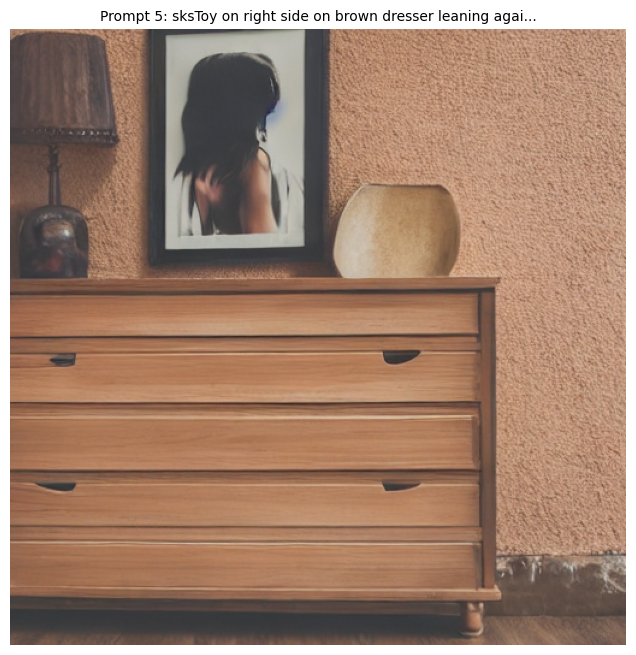

Размер изображения: (512, 512)

[6/7] Генерация: sksToy standing on brown dresser, looking slightly right, si...


  0%|          | 0/25 [00:00<?, ?it/s]

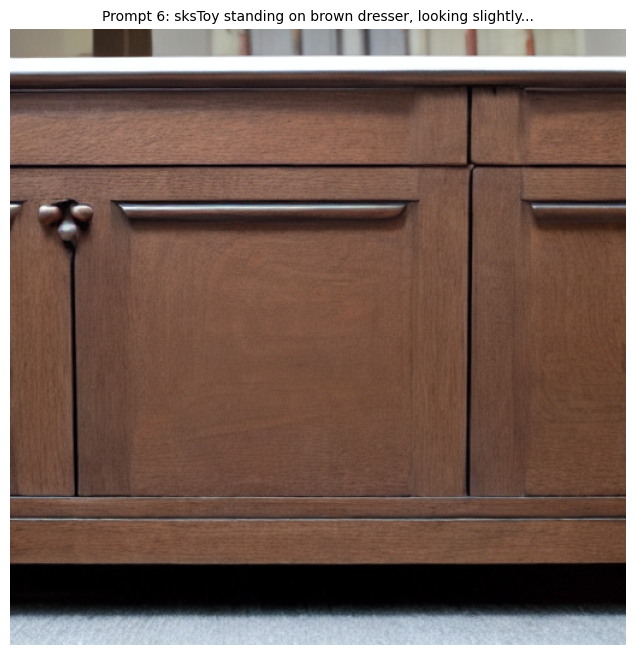

Размер изображения: (512, 512)

[7/7] Генерация: sksToy on a table centered, looking diagonally, tousled hair...


  0%|          | 0/25 [00:00<?, ?it/s]

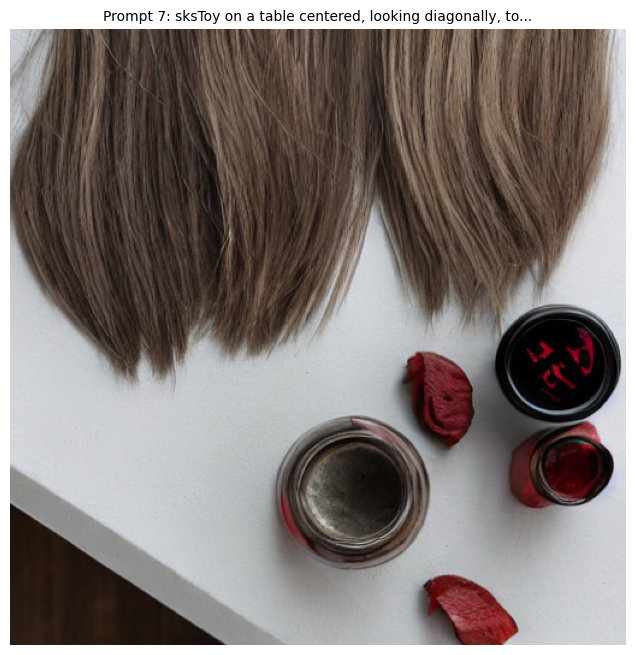

Размер изображения: (512, 512)


In [9]:
import numpy as np

for i, prompt in enumerate(prompts):
    print(f"\n[{i+1}/{len(prompts)}] Генерация: {prompt[:60]}...")

    with torch.no_grad():
        image = pipe(prompt, num_inference_steps=25).images[0]

    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.title(f"Prompt {i+1}: {prompt[:50]}...", fontsize=10)
    plt.axis('off')
    plt.show()
    print(f"Размер изображения: {image.size}")


--- Изображение 1 ---
Промпт: sksToy


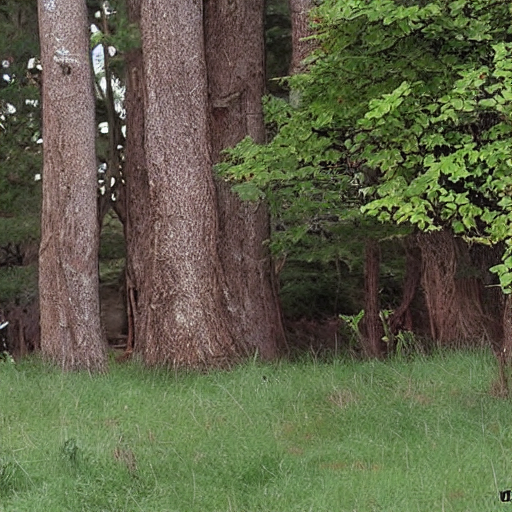



--- Изображение 2 ---
Промпт: sksToy standing on a dresser against brown wall, view from above, object slightly left of center


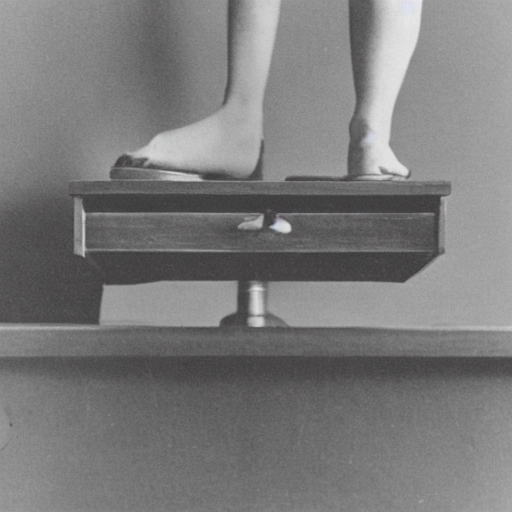



--- Изображение 3 ---
Промпт: sksToy on a brown dresser leaning against brown wall, side view, looking right, object slightly left of center


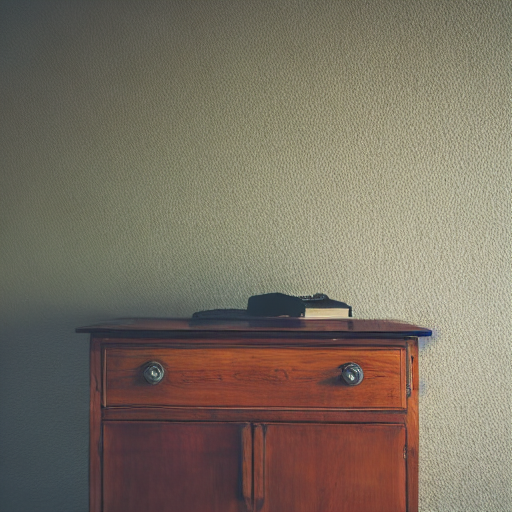



--- Изображение 4 ---
Промпт: sksToy on a brown dresser against brown wall, looking straight, centered


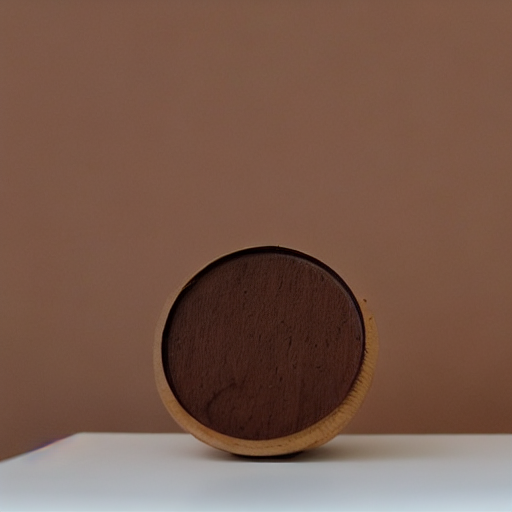



--- Изображение 5 ---
Промпт: sksToy on right side on brown dresser leaning against brown wall


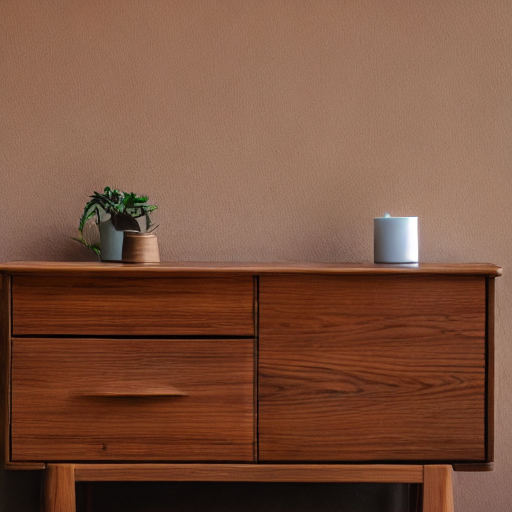



--- Изображение 6 ---
Промпт: sksToy standing on brown dresser, looking slightly right, side view


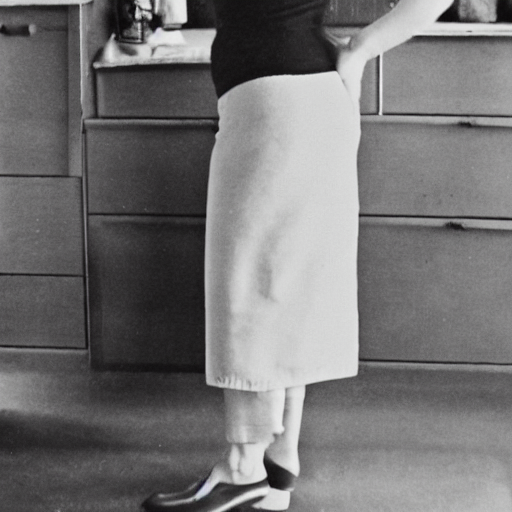



--- Изображение 7 ---
Промпт: sksToy on a table centered, looking diagonally, tousled hair


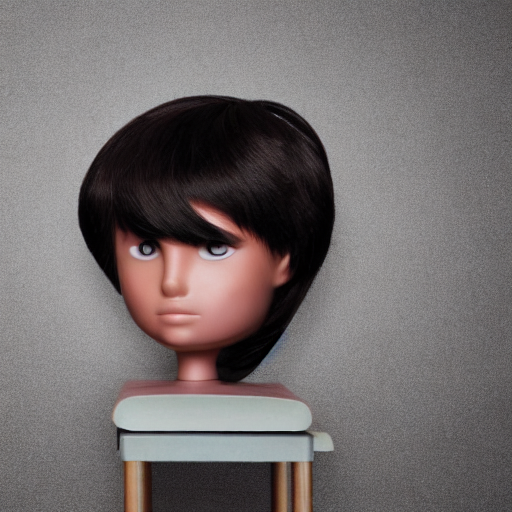

In [10]:
for i, (image, prompt) in enumerate(zip(images, prompts)):
    print(f"\n--- Изображение {i+1} ---")
    print(f"Промпт: {prompt}")
    display(image)
    print()